In [309]:
!pip install opencv-python numpy matplotlib

### Import necessary libraries

In [310]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

### Question 1

In [311]:
# Import Emma image
emma = cv.imread('a1images/emma.jpg', cv.IMREAD_GRAYSCALE)
assert emma is not None

(256,)


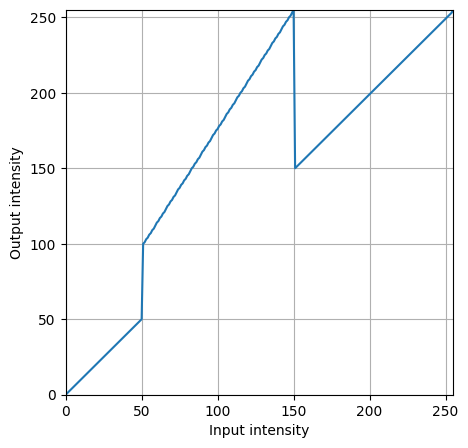

In [312]:
t1 = np.linspace(0,50, num=51).astype('uint8')
t2 = np.linspace(100,255, num=100).astype('uint8')
t3 = np.linspace(150,255, num=105).astype('uint8')

t = np.concatenate((t1,t2,t3), axis = 0).astype('uint8')
print(t.shape)

plt.figure(figsize=(5, 5))
plt.plot(t)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()

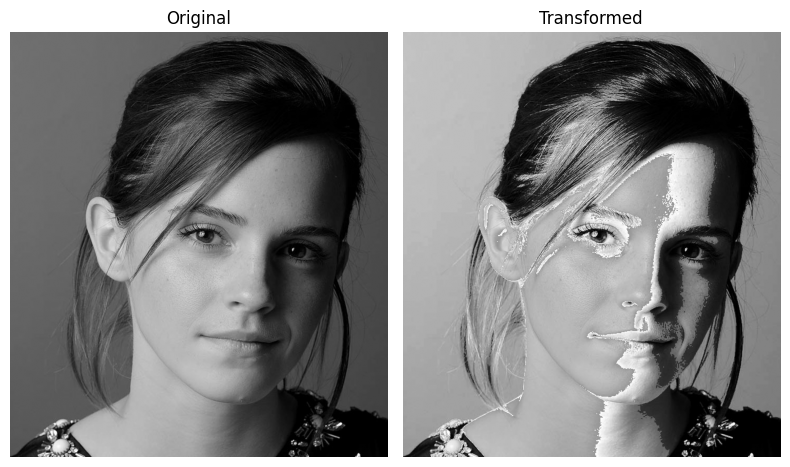

In [313]:
g = t[emma]

# Create the figure for plotting
fig, ax = plt.subplots(1, 2, figsize=(8, 6))
ax[0].imshow(emma, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original')
ax[0].axis("off")
ax[1].imshow(g, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Transformed')
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Question 2

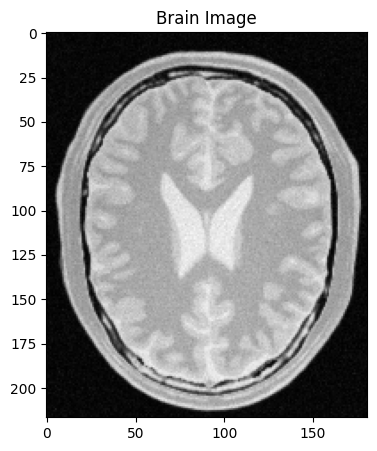

In [314]:
# Import brain image
brain = cv.imread('a1images/brain_proton_density_slice.png', cv.IMREAD_GRAYSCALE)
assert brain is not None

plt.figure(figsize=(5, 5))
plt.imshow(brain, cmap='grey',vmin=0, vmax=255)
plt.title('Brain Image')
plt.show()

(256,)


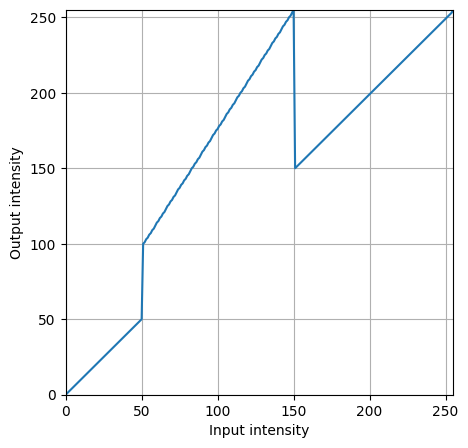

In [315]:
# Define piecewise transformation function
t1 = np.linspace(0, 50, num=51).astype('uint8')
t2 = np.linspace(100, 255, num=100).astype('uint8')
t3 = np.linspace(150, 255, num=105).astype('uint8')

# Concatenate all segments to create the transformation array
t = np.concatenate((t1, t2, t3), axis=0).astype('uint8')
print(t.shape)

# Plot the array
plt.figure(figsize=(5, 5))
plt.plot(t)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()

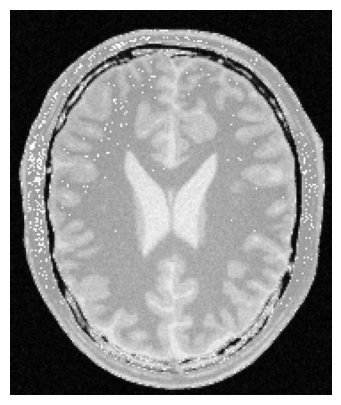

In [316]:
g = t[brain]

# Display the image
plt.figure(figsize=(5, 5))
plt.imshow(g, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

##### The above method used for Q1 doesn't work

### White Matter

(256,)


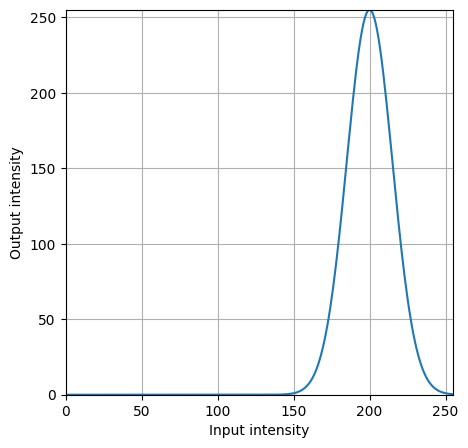

In [317]:
mu = 200
sigma = 15
x = np.linspace(0, 255, 256)
t =  255 * np.exp(-((x - mu)**2) / (2 * sigma**2))

# Ensure the output is in the valid range for image intensities [0, 255]
t = np.clip(t, 0, 255)

print(t.shape)

# Plot the array
plt.figure(figsize=(5, 5))
plt.plot(t)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()

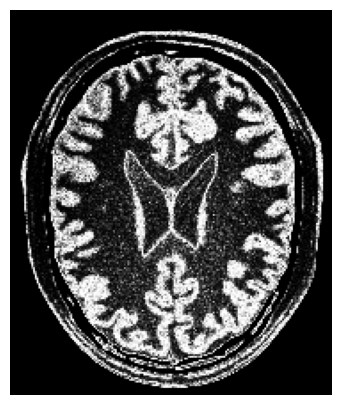

In [318]:
g = t[brain]

# Display the image
plt.figure(figsize=(5, 5))
plt.imshow(g, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

### Grey Matter

(256,)


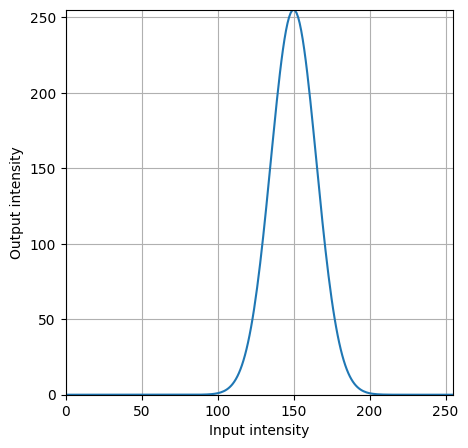

In [319]:
mu = 150
sigma = 15
x = np.linspace(0, 255, 256)
t =  255 * np.exp(-((x - mu)**2) / (2 * sigma**2))

# Ensure the output is in the valid range for image intensities [0, 255]
t = np.clip(t, 0, 255)

print(t.shape)

# Plot the array
plt.figure(figsize=(5, 5))
plt.plot(t)
plt.xlabel("Input intensity")
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.ylabel("Output intensity")
plt.grid(True)
plt.show()

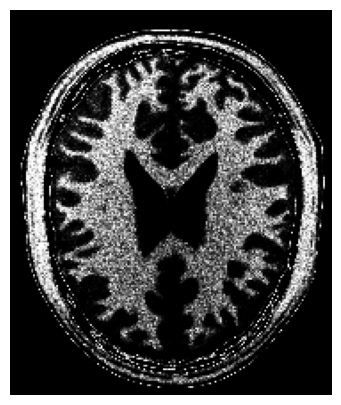

In [320]:
g = t[brain]

# Display the image
plt.figure(figsize=(5, 5))
plt.imshow(g, cmap='gray', vmin=0, vmax=255)
plt.axis('off')
plt.show()

### Question 3

In [321]:
# Import Emma image
img_bgr = cv.imread('a1images/highlights_and_shadows.jpg')
assert img_bgr is not None
img_lab = cv.cvtColor(img_bgr, cv.COLOR_BGR2LAB)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

In [322]:
# Split the image in to L*a*b* color space
L,a,b = cv.split(img_lab)

# Define and apply gamma transformation
gamma = 0.6
t = np.array([(i/255.0)**(gamma)*255 for i in np.arange(0, 256)]).astype('uint8')
L_modified = cv.LUT(L, t)

# Merge the channels
merged = cv.merge([L_modified, a, b])
img_modified = cv.cvtColor(merged, cv.COLOR_LAB2RGB)

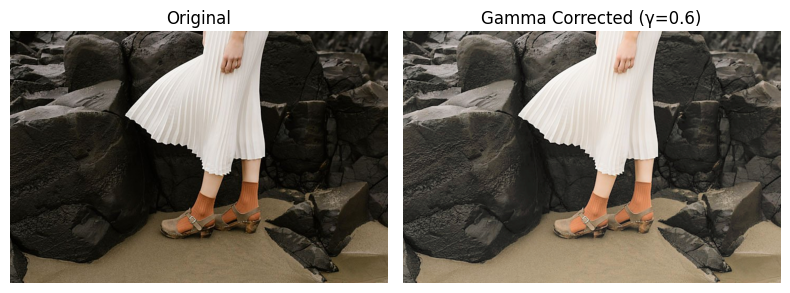

In [323]:
# Create a figure and axes
fig, axs = plt.subplots(1, 2, figsize=(8, 6))

# Plot the first image
axs[0].imshow(img_rgb)
axs[0].set_title('Original')
axs[0].axis('off')  # Turn off the axis

# Plot the second image
axs[1].imshow(img_modified)
axs[1].set_title(f'Gamma Corrected (γ={gamma})')
axs[1].axis('off')  # Turn off the axis

# Show the plot
plt.tight_layout()
plt.show()

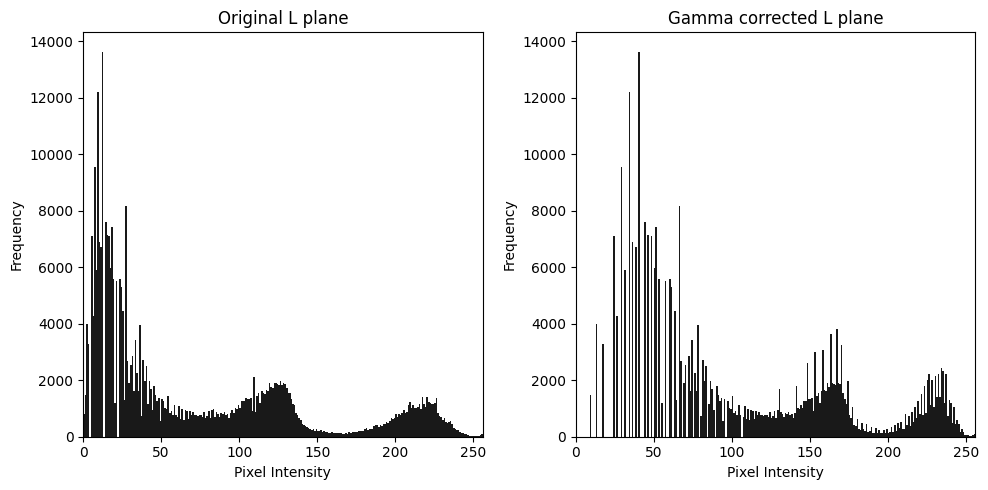

In [324]:
# Compute the histograms for both images
hist1 = cv.calcHist([L], [0], None, [256], [0, 256])
hist2 = cv.calcHist([L_modified], [0], None, [256], [0, 256])

L_flat = L.flatten()
L_modified_flat = L_modified.flatten()

# Create a figure with two subplots
plt.figure(figsize=(10, 5))

# First subplot: Histogram of the first image
plt.subplot(1, 2, 1)
plt.hist(L_flat, bins=256, range=(0, 256), color='black', alpha=0.9)
plt.title('Original L plane')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Second subplot: Histogram of the second image
plt.subplot(1, 2, 2)
plt.hist(L_modified_flat, bins=256, range=(0, 256), color='black', alpha=0.9)
plt.title('Gamma corrected L plane')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Display the plots side by side
plt.tight_layout()  # Adjusts the spacing between subplots for a neat layout
plt.show()

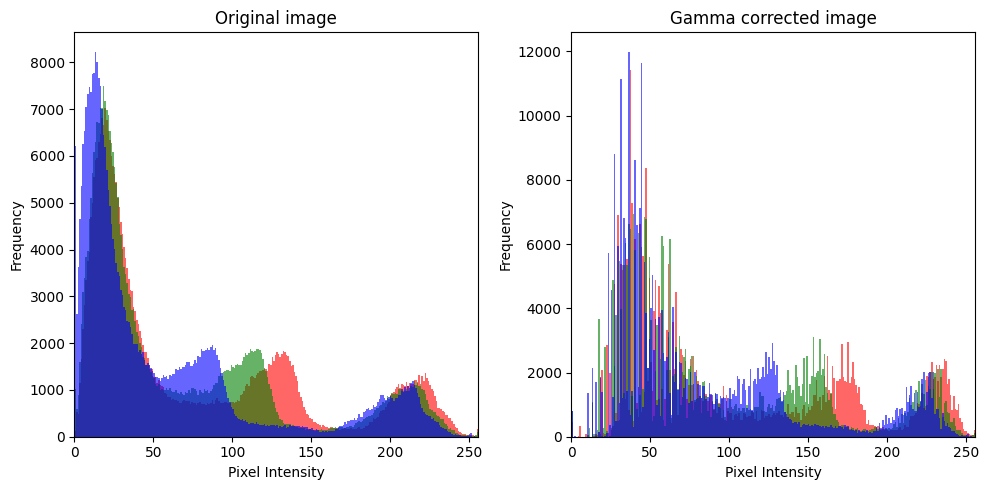

In [325]:
# Color channels
colors = ('r', 'g', 'b')  # Color channels
plt.figure(figsize=(10, 5))

# First image's histograms
plt.subplot(1, 2, 1)
for i, col in enumerate(colors):
    # Flatten the channel
    channel_flat = img_rgb[:, :, i].flatten()  # Extract and flatten the red, green, or blue channel
    plt.hist(channel_flat, bins=256, range=(0, 256), color=col, alpha=0.6)  # Use plt.hist
plt.title('Original image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Second image's histograms
plt.subplot(1, 2, 2)
for i, col in enumerate(colors):
    # Flatten the channel
    channel_flat = img_modified[:, :, i].flatten()  # Extract and flatten the channel
    plt.hist(channel_flat, bins=256, range=(0, 256), color=col, alpha=0.6)  # Use plt.hist
plt.title('Gamma corrected image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Display the plots side by side
plt.tight_layout()  # Adjusts the spacing between subplots for a neat layout
plt.show()

### Question 4

In [326]:
spider = cv.imread('a1images/spider.png')

spider_hsv  = cv.cvtColor(spider, cv.COLOR_BGR2HSV)
spider_rgb  = cv.cvtColor(spider, cv.COLOR_BGR2RGB)

H, S, V = cv.split(spider_hsv)

spider.shape

(438, 780, 3)

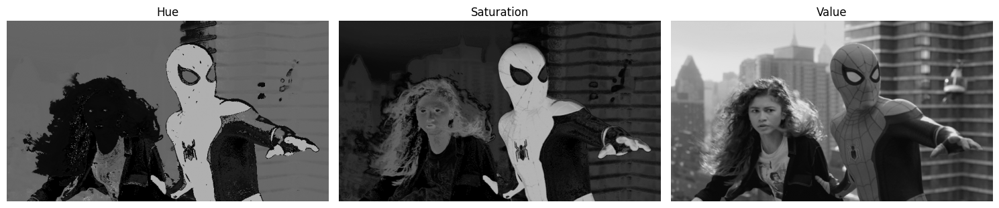

In [327]:
fig, ax = plt.subplots( 1, 3, figsize = (15,5))

ax[0].imshow(H, cmap='gray', vmin=0,vmax =255)
ax[0].set_title('Hue')
ax[0].axis('off')


ax[1].imshow(S, cmap='gray', vmin=0,vmax =255)
ax[1].set_title('Saturation')
ax[1].axis('off')


ax[2].imshow(V, cmap='gray', vmin=0,vmax =255)
ax[2].set_title('Value')
ax[2].axis('off')

plt.tight_layout()
plt.show()

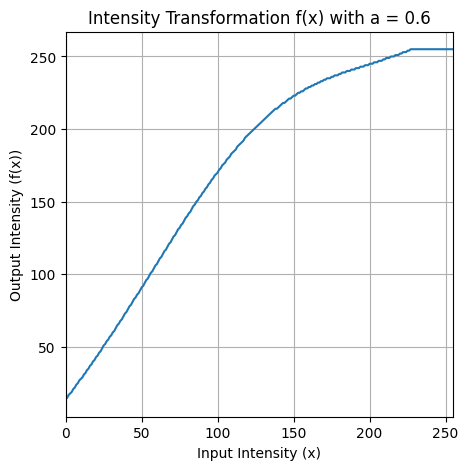

In [328]:
# Define the transformation function

a= 0.6
sigma = 70.0
x = np.arange(0,256)
f = np.minimum(x + a * 128 * np.exp(-((x-128)**2) / (2 * sigma ** 2)),255).astype('uint8')

# Display the image
plt.figure(figsize=(5, 5))
plt.plot(x, f)
plt.title(f'Intensity Transformation f(x) with a = {a}')
plt.xlabel('Input Intensity (x)')
plt.ylabel('Output Intensity (f(x))')
plt.grid(True)
plt.xlim([0, 255])
plt.xlim([0, 255])
plt.show()


In [329]:
# S_modified = cv.LUT(S , f)

# spider_modified = cv.merge(H,S_modified,V)
# spider_modified = cv.cvtColor(spider_modified, cv.COLOR_HSV2RGB)

# Apply transformation to Saturation plane
S_modified = cv.LUT(S, f)

# Merge
merged = cv.merge([H, S_modified, V])
spider_modified = cv.cvtColor(merged, cv.COLOR_HSV2RGB)

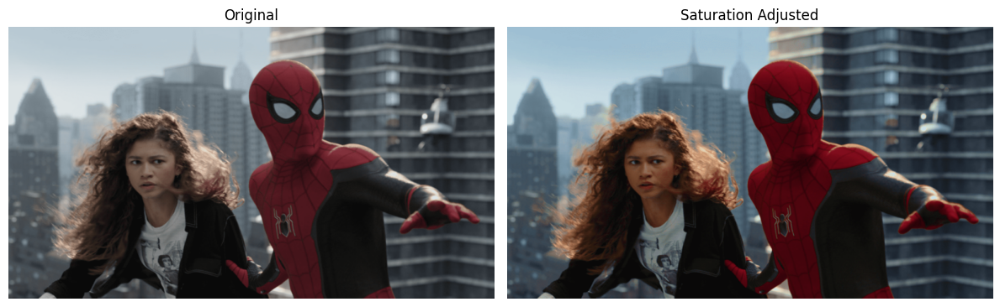

In [330]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

ax[0].imshow(spider_rgb)
ax[0].set_title('Original')
ax[0].axis("off")
ax[1].imshow(spider_modified)
ax[1].set_title('Saturation Adjusted')
ax[1].axis("off")


plt.tight_layout()
plt.show()

### Question 5 

In [331]:
# Import Shells image
shells = cv.imread('a1images/shells.tif', cv.IMREAD_GRAYSCALE)
assert shells is not None

In [332]:
def histogram_equalization(f):
    # Get image details
    L = 256
    M, N = f.shape

    # Get histogram
    hist = cv.calcHist([f], [0], None, [L], [0, L])
    cdf = hist.cumsum()

    # Define transformation
    t = np.array([(L-1)/(M*N)*cdf[k] for k in range(256)]).astype("uint8")

    return t[f]

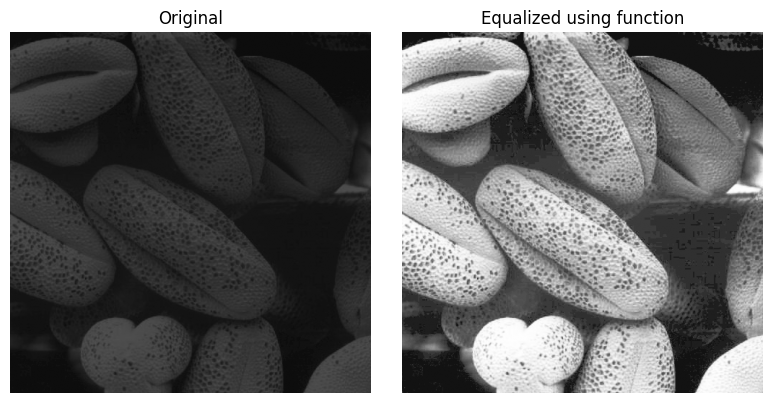

In [333]:
# Do histrogram equalization
equalized = histogram_equalization(shells)

# Create the figure for plotting
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(shells, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original')
ax[0].axis("off")
ax[1].imshow(equalized, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Equalized using function')
ax[1].axis("off")

# Show the plot
plt.tight_layout()
plt.show()

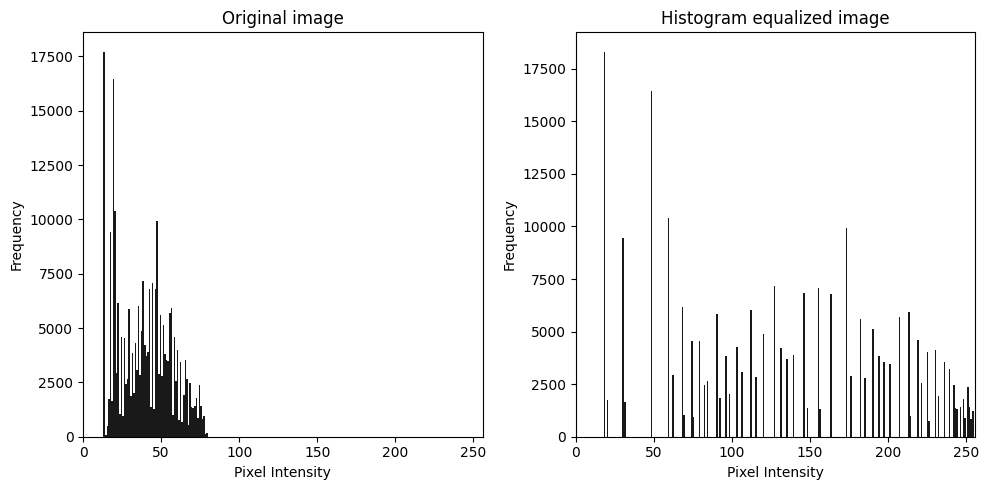

In [334]:
# Compute the histograms for both images
hist1 = cv.calcHist([shells], [0], None, [256], [0, 256])
hist2 = cv.calcHist([equalized], [0], None, [256], [0, 256])

# Create a figure with two subplots
plt.figure(figsize=(10, 5))

shells_flat = shells.flatten()
equalized_flat = equalized.flatten()

# First subplot: Histogram of the first image
plt.subplot(1, 2, 1)
plt.hist(shells_flat, bins=256, range=(0, 256), color='black', alpha=0.9)
plt.title('Original image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Second subplot: Histogram of the second image
plt.subplot(1, 2, 2)
plt.hist(equalized_flat, bins=256, range=(0, 256), color='black', alpha=0.9)
plt.title('Histogram equalized image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])

# Display the plots side by side
plt.tight_layout()  # Adjusts the spacing between subplots for a neat layout
plt.show()

### Question 6

In [335]:
# Import Jennifer image
jennifer = cv.imread('a1images/jeniffer.jpg')
assert jennifer is not None
jennifer_hsv = cv.cvtColor(jennifer, cv.COLOR_BGR2HSV)
jennifer_rgb = cv.cvtColor(jennifer, cv.COLOR_BGR2RGB)


# Split into planes
H, S, V = cv.split(jennifer_hsv)

jennifer.shape

(2160, 3840, 3)

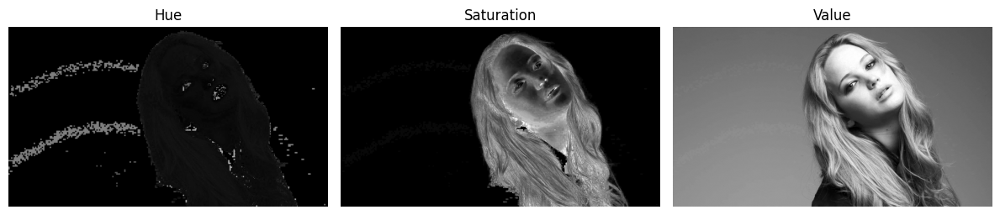

In [336]:
# Create the figure for plotting
fig, ax = plt.subplots(1, 3, figsize=(12, 8))

ax[0].imshow(H, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Hue')
ax[0].axis("off")
ax[1].imshow(S, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Saturation')
ax[1].axis("off")
ax[2].imshow(V, cmap='gray', vmin=0, vmax=255)
ax[2].set_title('Value')
ax[2].axis("off")

plt.tight_layout()
plt.show()


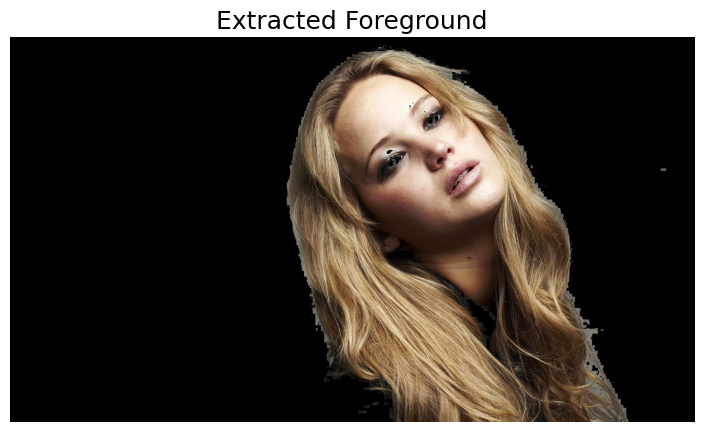

In [337]:
# Apply thresholding on Saturation plane
_, mask = cv.threshold(S, 12, 255, cv.THRESH_BINARY)

# Use bitwise_and to extract the foreground using the mask
foreground = cv.bitwise_and(jennifer, jennifer, mask=mask)

# Display the extracted foreground
plt.figure(figsize=(10, 5))

plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.title('Extracted Foreground', fontsize=18)
plt.axis('off')
plt.show()

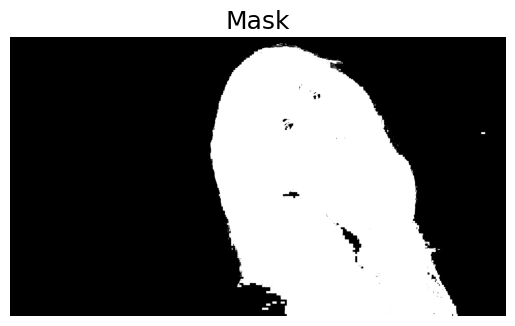

In [338]:
plt.imshow(mask, cmap='gray')
plt.title('Mask', fontsize=18)
plt.axis('off')
plt.show()

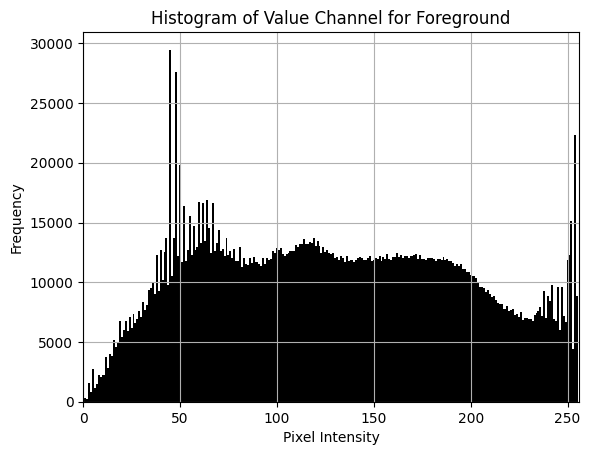

In [339]:
# Compute and plot the histogram of the Value (V) channel of the foreground
foreground_hsv = cv.cvtColor(foreground, cv.COLOR_BGR2HSV)
H_fg, S_fg, V_fg = cv.split(foreground_hsv)

# Calculate the histogram of the Value channel
hist = cv.calcHist([V_fg], [0], mask , [256], [0, 256])

# Create an array for the x positions of the bars
x_positions = np.arange(len(hist))

# Plot the histogram as a bar plot
plt.figure()
plt.bar(x_positions, hist.flatten(), color='black', width=1)  # Use width=1 for each bar
plt.title('Histogram of Value Channel for Foreground')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])  # Set x-axis limits
plt.grid(True)
plt.show()

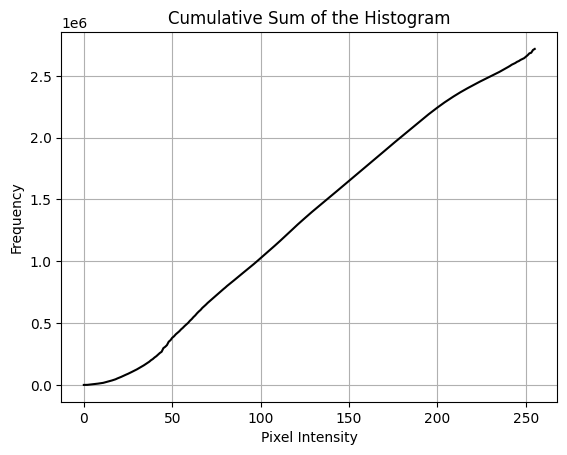

In [340]:
cdf = hist.cumsum()

# Plot the histogram
plt.figure()
plt.plot(cdf, color='black')
plt.title('Cumulative Sum of the Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

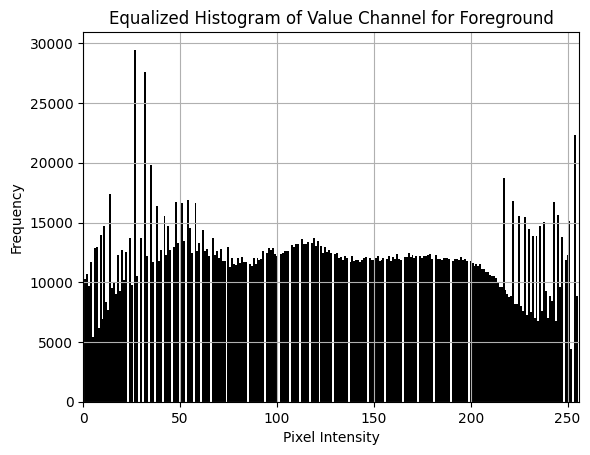

In [341]:
# Number of pixels
pixels = cdf[-1]

# Define transformation
t = np.array([(256-1)/(pixels)*cdf[k] for k in range(256)]).astype("uint8")

# Equalize
V_eq = t[V_fg]

# Calculate the histogram of the equalized Value channel
hist = cv.calcHist([V_eq], [0], mask, [256], [0, 256])

# Create an array for the x positions of the bars
x_positions = np.arange(len(hist))

# Plot the histogram as a bar plot
plt.figure()
plt.bar(x_positions, hist.flatten(), color='black', width=1)  # Use width=1 for each bar
plt.title('Equalized Histogram of Value Channel for Foreground')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])  # Set x-axis limits
plt.grid(True)
plt.show()

In [342]:
# Merge
merged = cv.merge([H_fg, S_fg, V_eq])
foreground_modified = cv.cvtColor(merged, cv.COLOR_HSV2RGB)

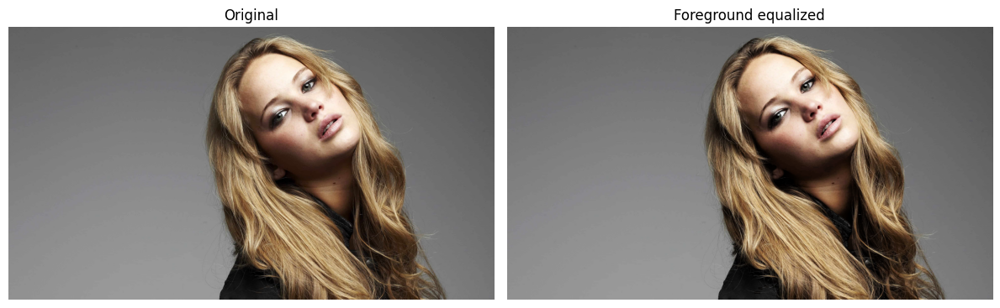

In [343]:
# Extract the background
background = cv.bitwise_and(jennifer, jennifer, mask=cv.bitwise_not(mask))

# Merge the equalized foreground and background
result = cv.add(cv.cvtColor(background, cv.COLOR_BGR2RGB), foreground_modified)

# Create a figure and axes
fig, axs = plt.subplots(1, 2, figsize=(12, 8))

# Plot the first image
axs[0].imshow(jennifer_rgb)
axs[0].set_title('Original')
axs[0].axis('off')  # Turn off the axis

# Plot the second image
axs[1].imshow(result)
axs[1].set_title('Foreground equalized')
axs[1].axis('off')  # Turn off the axis

# Show the plot
plt.tight_layout()
plt.show()

### Question 7

In [344]:
# Import Einstein image
einstein = cv.imread('a1images/einstein.png', cv.IMREAD_GRAYSCALE)
assert einstein is not None

einstein.shape

(380, 364)

In [345]:
# Define the Sobel-X filter
sobel_x = np.array([[-1, 0, 1], 
                    [-2, 0, 2], 
                    [-1, 0, 1]])

# Define the Sobel-Y filter
sobel_y = np.array([[-1, -2, -1], 
                    [0, 0, 0], 
                    [1, 2, 1]])

print("Sobel X filter:")
print(sobel_x)

print("\nSobel Y filter:")
print(sobel_y)

Sobel X filter:
[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]

Sobel Y filter:
[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]


In [346]:
# Apply the Sobel filter in the X direction
sobel_x_filtered = cv.filter2D(einstein, cv.CV_64F, sobel_x)

# Apply the Sobel filter in the Y direction
sobel_y_filtered = cv.filter2D(einstein, cv.CV_64F, sobel_y)

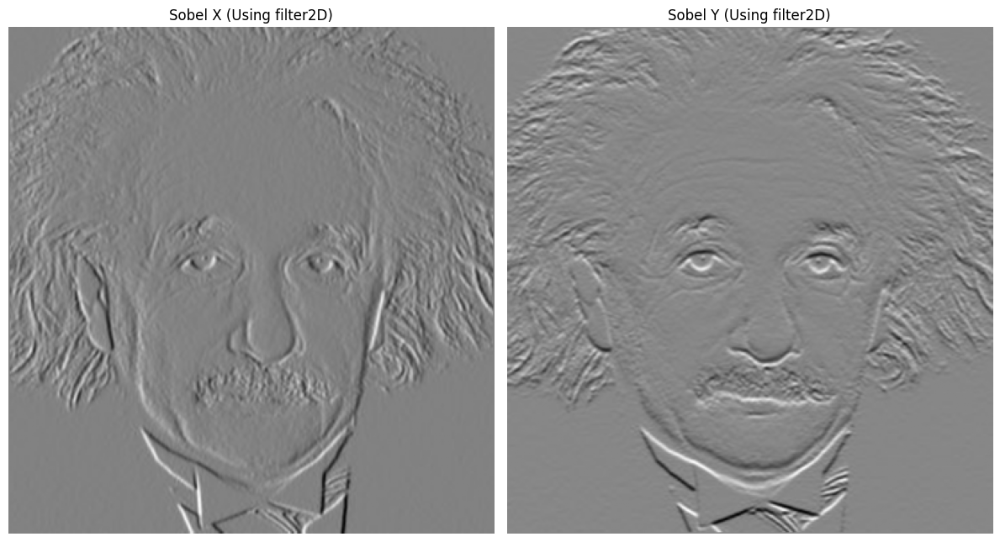

In [347]:
# Create the figure for plotting
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

ax[0].imshow(sobel_x_filtered, cmap='gray')
ax[0].set_title('Sobel X (Using filter2D)')
ax[0].axis("off")
ax[1].imshow(sobel_y_filtered, cmap='gray')
ax[1].set_title('Sobel Y (Using filter2D)')
ax[1].axis("off")

plt.tight_layout()
plt.show()

In [348]:
def apply_filter(image, filter):
    [rows, columns] = np.shape(image) # Get rows and columns of the image
    filtered_image = np.zeros(shape=(rows, columns)) # Create empty image
    
    for i in range(rows - 2):
        for j in range(columns - 2): # Process 2D convolution
            value = np.sum(np.multiply(filter, image[i:i + 3, j:j + 3])) 
            filtered_image[i + 1, j + 1] = value
    
    return filtered_image

In [349]:
# Apply the Sobel filter in the X direction
sobel_x_filtered = apply_filter(einstein, sobel_x)

# Apply the Sobel filter in the Y direction
sobel_y_filtered = apply_filter(einstein, sobel_y)

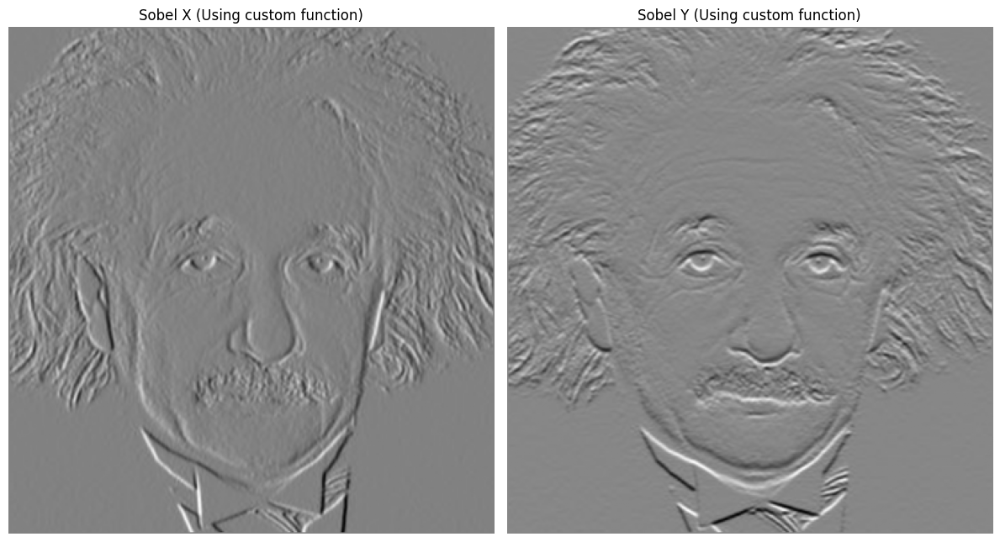

In [350]:
# Create the figure for plotting
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

ax[0].imshow(sobel_x_filtered, cmap='gray')
ax[0].set_title('Sobel X (Using custom function)')
ax[0].axis("off")
ax[1].imshow(sobel_y_filtered, cmap='gray')
ax[1].set_title('Sobel Y (Using custom function)')
ax[1].axis("off")

plt.tight_layout()
plt.show()

In [351]:
# Sobel x filter seperated
sobel_x_vertical = np.array([[1], [2], [1]])
sobel_x_horizontal = np.array([[-1, 0, 1]])

# Sobel y filter seperated
sobel_y_vertical = np.array([[-1], [0], [1]])
sobel_y_horizontal = np.array([[1, 2, 1]])

# Apply the vertical and horizontal filters consecutively
x_mid = cv.filter2D(einstein, cv.CV_64F, sobel_x_horizontal)
x_filtered_image = cv.filter2D(x_mid, cv.CV_64F, sobel_x_vertical)

y_mid = cv.filter2D(einstein, cv.CV_64F, sobel_y_vertical)
y_filtered_image = cv.filter2D(y_mid, cv.CV_64F, sobel_y_horizontal)

print(sobel_x_vertical @ sobel_x_horizontal)
print(sobel_y_vertical @ sobel_y_horizontal)

[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]
[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]


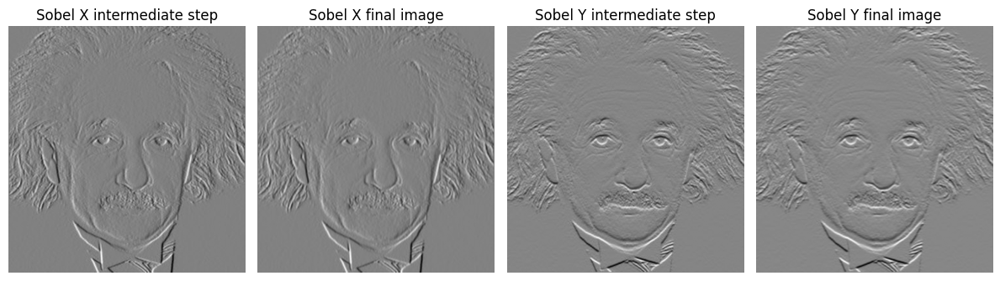

In [352]:
# Create the figure for plotting
fig, ax = plt.subplots(1, 4, figsize=(12, 8))

ax[0].imshow(x_mid, cmap='gray')
ax[0].set_title('Sobel X intermediate step')
ax[0].axis("off")
ax[1].imshow(x_filtered_image, cmap='gray')
ax[1].set_title('Sobel X final image')
ax[1].axis("off")
ax[2].imshow(y_mid, cmap='gray')
ax[2].set_title('Sobel Y intermediate step')
ax[2].axis("off")
ax[3].imshow(y_filtered_image, cmap='gray')
ax[3].set_title('Sobel Y final image')
ax[3].axis("off")

plt.tight_layout()
plt.show()

### Question 8

In [353]:
def zoom_nearest_neighbor(img, scale):
    """
    Zoom image using nearest neighbor interpolation
    """
    h, w = img.shape[:2]
    new_h = int(h * scale)
    new_w = int(w * scale)
    
    # Create output image
    if len(img.shape) == 3:
        output = np.zeros((new_h, new_w, img.shape[2]), dtype=img.dtype)
    else:
        output = np.zeros((new_h, new_w), dtype=img.dtype)
    
    # Fill the output image
    for i in range(new_h):
        for j in range(new_w):
            # Find corresponding pixel in original image
            orig_i = int(i / scale)
            orig_j = int(j / scale)
            
            # Clamp to image boundaries
            orig_i = min(orig_i, h - 1)
            orig_j = min(orig_j, w - 1)
            
            output[i, j] = img[orig_i, orig_j]
    
    return output

In [354]:
def zoom_bilinear(img, scale):
    """
    Zoom image using bilinear interpolation
    """
    h, w = img.shape[:2]
    new_h = int(h * scale)
    new_w = int(w * scale)
    
    # Create output image
    if len(img.shape) == 3:
        output = np.zeros((new_h, new_w, img.shape[2]), dtype=np.float32)
    else:
        output = np.zeros((new_h, new_w), dtype=np.float32)
    
    # Fill the output image
    for i in range(new_h):
        for j in range(new_w):
            # Find corresponding position in original image
            orig_i = i / scale
            orig_j = j / scale
            
            # Get surrounding pixels
            i0 = int(orig_i)
            i1 = min(i0 + 1, h - 1)
            j0 = int(orig_j)
            j1 = min(j0 + 1, w - 1)
            
            # Calculate weights
            di = orig_i - i0
            dj = orig_j - j0
            
            # Bilinear interpolation formula
            output[i, j] = (1-di)*(1-dj)*img[i0,j0] + di*(1-dj)*img[i1,j0] + \
                          (1-di)*dj*img[i0,j1] + di*dj*img[i1,j1]
    
    return output.astype(img.dtype)

In [355]:
def calculate_ssd(img1, img2):
    """
    Calculate normalized SSD between two images
    Images must be same size
    """
    if img1.shape != img2.shape:
        print(f"Error: Image shapes don't match: {img1.shape} vs {img2.shape}")
        return None
    
    # Convert to float for calculation
    img1_float = img1.astype(np.float64)
    img2_float = img2.astype(np.float64)
    
    # Calculate SSD
    diff = img1_float - img2_float
    ssd = np.sum(diff ** 2)
    
    # Normalize by number of pixels
    normalized_ssd = ssd / img1.size
    
    return normalized_ssd


Normalized SSD (Nearest Neighbor): 136.26904899691357
Normalized SSD (Bilinear): 200.24514017489713


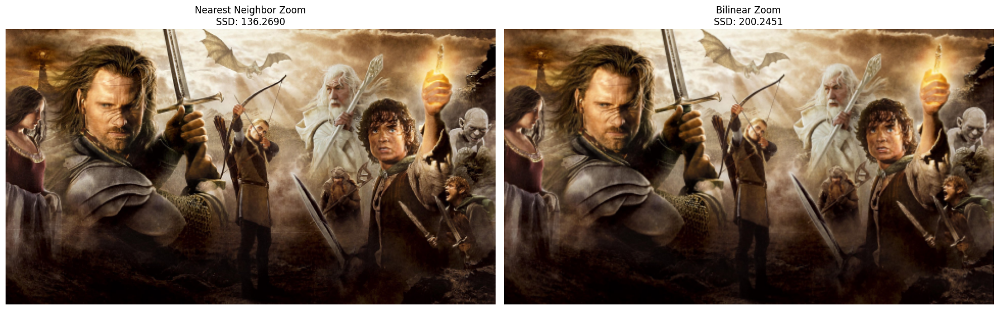

In [366]:
# Load the original small image and the reference full-size image
small_image = cv.imread('a1images/a1q5images/im01small.png')
reference_image = cv.imread('a1images/a1q5images/im01.png')

# Apply different zooming methods to the small image
zoomed_nearest_neighbor = zoom_nearest_neighbor(small_image, 4)
zoomed_bilinear = zoom_bilinear(small_image, 4)

# Calculate SSD between reference image and zoomed images
ssd_nearest_neighbor = calculate_ssd(reference_image, zoomed_nearest_neighbor)
ssd_bilinear = calculate_ssd(reference_image, zoomed_bilinear)

print(f"Normalized SSD (Nearest Neighbor): {ssd_nearest_neighbor}")
print(f"Normalized SSD (Bilinear): {ssd_bilinear}")

# Create comparison plot
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Convert BGR to RGB for proper matplotlib display

zoomed_nearest_neighbor_rgb = cv.cvtColor(zoomed_nearest_neighbor, cv.COLOR_BGR2RGB)
zoomed_bilinear_rgb = cv.cvtColor(zoomed_bilinear, cv.COLOR_BGR2RGB)

# Display images with SSD values in titles

axes[0].imshow(zoomed_nearest_neighbor_rgb)
axes[0].set_title(f'Nearest Neighbor Zoom\nSSD: {ssd_nearest_neighbor:.4f}')
axes[0].axis("off")

axes[1].imshow(zoomed_bilinear_rgb)
axes[1].set_title(f'Bilinear Zoom\nSSD: {ssd_bilinear:.4f}')
axes[1].axis("off")

plt.tight_layout()
plt.show()

Normalized SSD (Nearest Neighbor): 26.446087384259258
Normalized SSD (Bilinear): 48.96066550925926


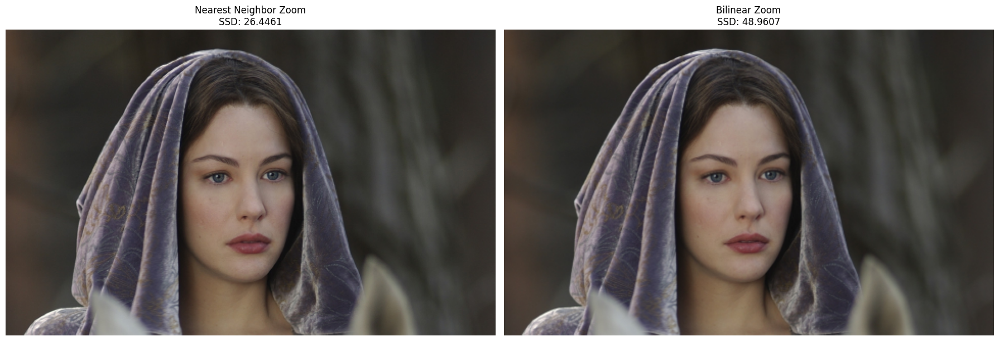

In [368]:
# Load the original small image and the reference full-size image
small_image = cv.imread('a1images/a1q5images/im02small.png')
reference_image = cv.imread('a1images/a1q5images/im02.png')

# Apply different zooming methods to the small image
zoomed_nearest_neighbor = zoom_nearest_neighbor(small_image, 4)
zoomed_bilinear = zoom_bilinear(small_image, 4)

# Calculate SSD between reference image and zoomed images
ssd_nearest_neighbor = calculate_ssd(reference_image, zoomed_nearest_neighbor)
ssd_bilinear = calculate_ssd(reference_image, zoomed_bilinear)

print(f"Normalized SSD (Nearest Neighbor): {ssd_nearest_neighbor}")
print(f"Normalized SSD (Bilinear): {ssd_bilinear}")

# Create comparison plot
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Convert BGR to RGB for proper matplotlib display

zoomed_nearest_neighbor_rgb = cv.cvtColor(zoomed_nearest_neighbor, cv.COLOR_BGR2RGB)
zoomed_bilinear_rgb = cv.cvtColor(zoomed_bilinear, cv.COLOR_BGR2RGB)

axes[0].imshow(zoomed_nearest_neighbor_rgb)
axes[0].set_title(f'Nearest Neighbor Zoom\nSSD: {ssd_nearest_neighbor:.4f}')
axes[0].axis("off")

axes[1].imshow(zoomed_bilinear_rgb)
axes[1].set_title(f'Bilinear Zoom\nSSD: {ssd_bilinear:.4f}')
axes[1].axis("off")

plt.tight_layout()
plt.show()

### Question 9

In [357]:
# Import images
daisy = cv.imread('a1images/daisy.jpg')
assert daisy is not None

daisy.shape

(841, 561, 3)

In [358]:
mask = np.zeros(daisy.shape[:2],np.uint8)
 
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)

In [359]:
rect = (50,100,550,490)
cv.grabCut(daisy,mask,rect,bgdModel,fgdModel,5,cv.GC_INIT_WITH_RECT)

mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')

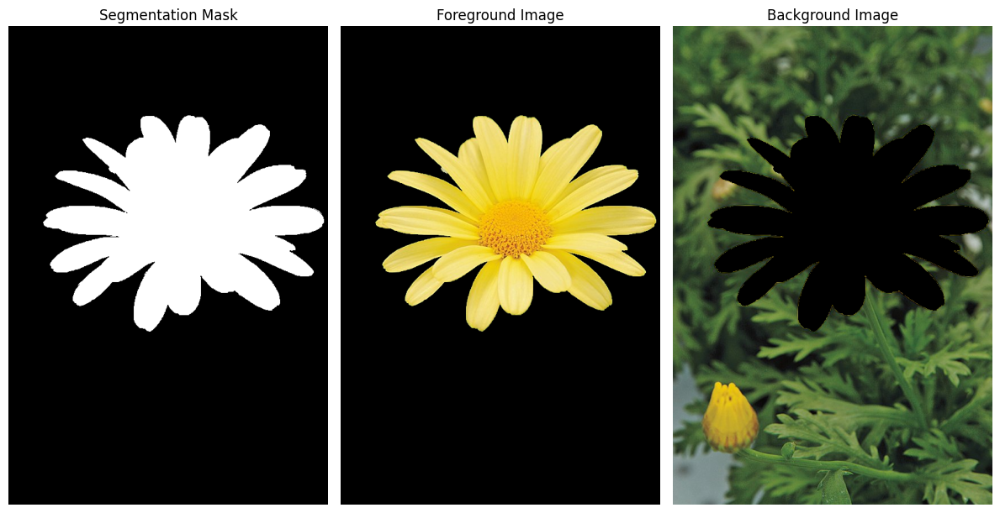

In [360]:
# Extract the foreground by multiplying the mask with the image
foreground = daisy * mask2[:, :, np.newaxis]

# Extract the background by subtracting the foreground from the original image
background = cv.subtract(daisy, foreground)

# Show the results
fig, axs = plt.subplots(1, 3, figsize=(12, 6))

axs[0].imshow(mask2, cmap='gray')
axs[0].set_title('Segmentation Mask')
axs[0].axis('off')

axs[1].imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
axs[1].set_title('Foreground Image')
axs[1].axis('off')

axs[2].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
axs[2].set_title('Background Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

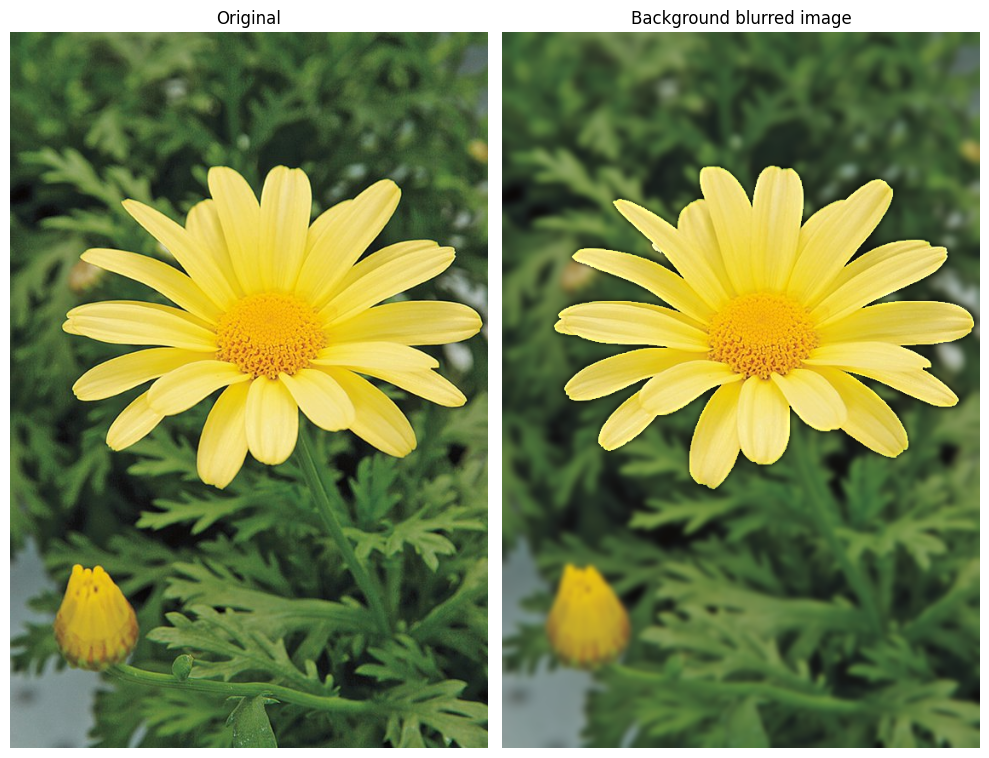

In [361]:
# Apply Gaussian blur to the background
blurred_background = cv.GaussianBlur(background, (25, 25), 3)

# Join image
blurred = cv.add(foreground, blurred_background)

# Show the results
fig, axs = plt.subplots(1, 2, figsize=(10, 8))

axs[0].imshow(cv.cvtColor(daisy, cv.COLOR_BGR2RGB))
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(cv.cvtColor(blurred, cv.COLOR_BGR2RGB))
axs[1].set_title('Background blurred image')
axs[1].axis('off')

plt.tight_layout()
plt.show()